In [ ]:
import os
import xml.etree.ElementTree as ET

def convert_voc_to_yolo(voc_dir, yolo_dir, class_names):
    """
    Convert Pascal VOC XML annotations to YOLO format.

    Parameters:
    voc_dir (str): Path to directory containing XML annotation files.
    yolo_dir (str): Path to save YOLO format annotations.
    class_names (list): List of class names (e.g., ['licence']).
    """
    if not os.path.exists(yolo_dir):
        os.makedirs(yolo_dir)

    for file in os.listdir(voc_dir):
        if file.endswith(".xml"):
            xml_path = os.path.join(voc_dir, file)
            tree = ET.parse(xml_path)
            root = tree.getroot()

            image_w = int(root.find("size/width").text)
            image_h = int(root.find("size/height").text)

            yolo_annotations = []
            for obj in root.findall("object"):
                class_name = obj.find("name").text
                if class_name not in class_names:
                    continue

                class_id = class_names.index(class_name)
                bbox = obj.find("bndbox")
                xmin = int(bbox.find("xmin").text)
                ymin = int(bbox.find("ymin").text)
                xmax = int(bbox.find("xmax").text)
                ymax = int(bbox.find("ymax").text)

                x_center = (xmin + xmax) / 2.0 / image_w
                y_center = (ymin + ymax) / 2.0 / image_h
                width = (xmax - xmin) / image_w
                height = (ymax - ymin) / image_h

                yolo_annotations.append(f"{class_id} {x_center} {y_center} {width} {height}")

            yolo_filename = os.path.join(yolo_dir, file.replace(".xml", ".txt"))
            with open(yolo_filename, "w") as f:
                f.write("\n".join(yolo_annotations))

    print(f"Converted {len(os.listdir(voc_dir))} XML files to YOLO format.")

# Example usage
voc_annotations_dir = "/content/drive/MyDrive/archive (38)/annotations"  # Change this to your XML annotations path
yolo_labels_dir = "/content/drive/MyDrive/archive (38)/labels"  # Change this to where you want to save YOLO labels
class_names = ['licence']  # Define your class names

convert_voc_to_yolo(voc_annotations_dir, yolo_labels_dir, class_names)


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/archive (38)/annotations'

In [ ]:
!pip install ultralytics pandas opencv-python lxml

import os
import shutil
import random
import cv2
import pandas as pd
import xml.etree.ElementTree as ET
from sklearn.model_selection import train_test_split
from ultralytics import YOLO


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 977.3/977.3 kB 24.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 74.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 62.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 90.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
import os
import shutil
import math

# Define dataset paths
DATASET_PATH = '/content/drive/MyDrive/archive (38)'
IMAGES_PATH = '/content/drive/MyDrive/archive (38)/images'
LABELS_PATH = '/content/drive/MyDrive/archive (38)/labels'

# Create train, valid, test directories
for split in ['train', 'valid', 'test']:
    os.makedirs(f"{DATASET_PATH}/{split}/images", exist_ok=True)
    os.makedirs(f"{DATASET_PATH}/{split}/labels", exist_ok=True)

# Get sorted list of image names (without extensions)
image_files = sorted(os.listdir(IMAGES_PATH))
image_names = [os.path.splitext(f)[0] for f in image_files if f.endswith('.png')]  # Only .png images

# Ensure images that have corresponding labels are included
valid_data = [(name, ".png") for name in image_names if os.path.exists(os.path.join(LABELS_PATH, name + ".txt"))]

# Compute dataset split sizes
total_images = len(valid_data)
train_size = math.ceil(0.75 * total_images)
valid_test_size = total_images - train_size
valid_size = math.ceil(0.66 * valid_test_size)
test_size = valid_test_size - valid_size

# Split dataset
train_files = valid_data[:train_size]
valid_files = valid_data[train_size:train_size + valid_size]
test_files = valid_data[train_size + valid_size:]

# Function to move images and labels together
def move_files(file_list, split):
    for name, ext in file_list:
        img_src = os.path.join(IMAGES_PATH, name + ext)
        label_src = os.path.join(LABELS_PATH, name + ".txt")

        img_dest = os.path.join(DATASET_PATH, split, "images", name + ext)
        label_dest = os.path.join(DATASET_PATH, split, "labels", name + ".txt")

        if os.path.exists(img_src) and os.path.exists(label_src):
            shutil.move(img_src, img_dest)
            shutil.move(label_src, label_dest)
        else:
            print(f"⚠️ Missing file: {img_src} or {label_src}")

# Move files to respective folders
move_files(train_files, "train")
move_files(valid_files, "valid")
move_files(test_files, "test")

print(f"✅ Dataset splitting completed!")
print(f"📂 Train: {len(train_files)} images")
print(f"📂 Valid: {len(valid_files)} images")
print(f"📂 Test: {len(test_files)} images")


✅ Dataset splitting completed!
📂 Train: 325 images
📂 Valid: 72 images
📂 Test: 36 images


In [ ]:
yaml_content = f"""path: {DATASET_PATH}
train: train/images
val: valid/images
test: test/images

nc: 1
names: ['licence']
"""

with open(f"{DATASET_PATH}/data.yaml", "w") as f:
    f.write(yaml_content)

print("data.yaml created!")


data.yaml created!


In [ ]:
!yolo detect train model=yolov8n.pt data="/content/drive/MyDrive/archive (38)/data.yaml" epochs=50 imgsz=640 batch=16


100% 6.25M/6.25M [00:00<00:00, 106MB/s]
Ultralytics 8.3.98 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/archive (38)/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, sa

In [ ]:
# Load trained model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Define test images path
TEST_IMAGES_PATH = os.path.join(DATASET_PATH, "test/images")

# Run detection
results = model.predict(TEST_IMAGES_PATH, save=True, conf=0.25)

print("Inference completed!")


FileNotFoundError: [Errno 2] No such file or directory: '/content/runs/detect/train/weights/best.pt'

In [ ]:
from ultralytics import YOLO
import time
import numpy as np
from tqdm import tqdm
import glob  # To get list of PNG images

# Load trained YOLOv8 model
model_path = "/content/drive/MyDrive/archive (38)/yolov8_license_plate.pt"  # Update your model path
model = YOLO(model_path)

# Load all PNG test images from the test folder
test_images_path = "/content/drive/MyDrive/archive (38)/test/images"  # Update your test images folder
image_paths = glob.glob(test_images_path + "/*.png")  # Get all PNG images

if not image_paths:
    raise FileNotFoundError(f"No PNG images found in {test_images_path}")

# Metrics storage
total_time = 0
all_precisions, all_recalls, all_IoUs = [], [], []

# Process each image
for img in tqdm(image_paths, desc="Evaluating test images"):
    start_time = time.time()

    # Run inference
    results = model(img)

    # Measure time taken
    total_time += time.time() - start_time

    # Extract metrics from YOLO results
    boxes = results[0].boxes  # Detected boxes
    if boxes is not None:
        all_precisions.append(boxes.conf.mean().item())  # Precision approximation using confidence score
        all_recalls.append(len(boxes) > 0)  # If at least one detection is made, recall = 1, else 0
        all_IoUs.append(boxes.iou.mean().item() if hasattr(boxes, 'iou') else 0)

# Calculate average metrics
precision = np.mean(all_precisions) if all_precisions else 0
recall = np.mean(all_recalls) if all_recalls else 0
IoU = np.mean(all_IoUs) if all_IoUs else 0
F1_score = 2 * (precision * recall) / (precision + recall + 1e-6)  # Avoid division by zero

# Inference Speed
avg_time = total_time / len(image_paths)
fps = 1 / avg_time

# Print Results
print(f"\n🚀 **YOLOv8 License Plate Detection Metrics on Test Set:**")
print(f"Precision: {precision:.2%}")
print(f"Recall: {recall:.2%}")
print(f"F1-score: {F1_score:.2%}")
print(f"IoU: {IoU:.2f}")
print(f"Avg Inference Time: {avg_time:.4f} sec/image")
print(f"FPS: {fps:.2f}")


Evaluating test images:   0%|          | 0/36 [00:00<?, ?it/s]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars67.png: 320x640 1 licence, 35.7ms
Speed: 14.1ms preprocess, 35.7ms inference, 400.1ms postprocess per image at shape (1, 3, 320, 640)


Evaluating test images:   3%|▎         | 1/36 [00:04<02:33,  4.40s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars68.png: 448x640 1 licence, 37.3ms
Speed: 3.5ms preprocess, 37.3ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


Evaluating test images:   6%|▌         | 2/36 [00:05<01:29,  2.62s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars7.png: 448x640 1 licence, 11.5ms
Speed: 7.1ms preprocess, 11.5ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


Evaluating test images:   8%|▊         | 3/36 [00:06<01:03,  1.91s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars69.png: 448x640 1 licence, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


Evaluating test images:  11%|█         | 4/36 [00:08<00:55,  1.74s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars87.png: 480x640 2 licences, 35.7ms
Speed: 2.1ms preprocess, 35.7ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


Evaluating test images:  14%|█▍        | 5/36 [00:09<00:45,  1.48s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars71.png: 384x640 2 licences, 37.2ms
Speed: 1.8ms preprocess, 37.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


Evaluating test images:  17%|█▋        | 6/36 [00:10<00:42,  1.43s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars8.png: 320x640 1 licence, 7.4ms
Speed: 1.6ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 640)


Evaluating test images:  19%|█▉        | 7/36 [00:11<00:38,  1.34s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars86.png: 384x640 1 licence, 7.1ms
Speed: 2.1ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


Evaluating test images:  22%|██▏       | 8/36 [00:12<00:35,  1.25s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars79.png: 576x640 1 licence, 35.4ms
Speed: 4.3ms preprocess, 35.4ms inference, 1.3ms postprocess per image at shape (1, 3, 576, 640)


Evaluating test images:  25%|██▌       | 9/36 [00:14<00:33,  1.23s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars85.png: 448x640 5 licences, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


Evaluating test images:  28%|██▊       | 10/36 [00:15<00:33,  1.27s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars72.png: 544x640 1 licence, 34.7ms
Speed: 4.0ms preprocess, 34.7ms inference, 1.3ms postprocess per image at shape (1, 3, 544, 640)


Evaluating test images:  31%|███       | 11/36 [00:16<00:30,  1.21s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars76.png: 480x640 4 licences, 15.2ms
Speed: 3.4ms preprocess, 15.2ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)


Evaluating test images:  33%|███▎      | 12/36 [00:17<00:28,  1.18s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars84.png: 480x640 1 licence, 8.7ms
Speed: 3.4ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


Evaluating test images:  36%|███▌      | 13/36 [00:18<00:25,  1.09s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars88.png: 480x640 1 licence, 7.9ms
Speed: 3.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


Evaluating test images:  39%|███▉      | 14/36 [00:19<00:22,  1.04s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars80.png: 480x640 1 licence, 6.8ms
Speed: 2.4ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


Evaluating test images:  42%|████▏     | 15/36 [00:20<00:22,  1.05s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars78.png: 480x640 1 licence, 6.7ms
Speed: 2.3ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


Evaluating test images:  44%|████▍     | 16/36 [00:21<00:20,  1.01s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars82.png: 256x640 1 licence, 49.7ms
Speed: 1.4ms preprocess, 49.7ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 640)


Evaluating test images:  47%|████▋     | 17/36 [00:22<00:18,  1.00it/s]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars70.png: 384x640 1 licence, 7.4ms
Speed: 1.9ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


Evaluating test images:  50%|█████     | 18/36 [00:23<00:18,  1.03s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars75.png: 416x640 3 licences, 34.6ms
Speed: 2.0ms preprocess, 34.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Evaluating test images:  53%|█████▎    | 19/36 [00:24<00:18,  1.07s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars73.png: 384x640 1 licence, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


Evaluating test images:  56%|█████▌    | 20/36 [00:25<00:16,  1.03s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars83.png: 480x640 2 licences, 7.2ms
Speed: 2.8ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


Evaluating test images:  58%|█████▊    | 21/36 [00:26<00:15,  1.02s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars74.png: 448x640 1 licence, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


Evaluating test images:  61%|██████    | 22/36 [00:27<00:13,  1.00it/s]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars81.png: 480x640 2 licences, 15.1ms
Speed: 3.1ms preprocess, 15.1ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


Evaluating test images:  64%|██████▍   | 23/36 [00:28<00:12,  1.02it/s]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars77.png: 448x640 1 licence, 7.2ms
Speed: 2.3ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


Evaluating test images:  67%|██████▋   | 24/36 [00:29<00:12,  1.04s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars91.png: 416x640 1 licence, 9.2ms
Speed: 2.9ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Evaluating test images:  69%|██████▉   | 25/36 [00:30<00:11,  1.03s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars90.png: 480x640 2 licences, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


Evaluating test images:  72%|███████▏  | 26/36 [00:31<00:10,  1.06s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars99.png: 640x480 1 licence, 35.5ms
Speed: 2.6ms preprocess, 35.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Evaluating test images:  75%|███████▌  | 27/36 [00:32<00:09,  1.10s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars89.png: 448x640 5 licences, 7.4ms
Speed: 2.0ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


Evaluating test images:  78%|███████▊  | 28/36 [00:33<00:08,  1.05s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars94.png: 512x640 1 licence, 43.7ms
Speed: 2.3ms preprocess, 43.7ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 640)


Evaluating test images:  81%|████████  | 29/36 [00:35<00:07,  1.09s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars9.png: 512x640 1 licence, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)


Evaluating test images:  83%|████████▎ | 30/36 [00:35<00:06,  1.00s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars92.png: 448x640 1 licence, 9.5ms
Speed: 2.7ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


Evaluating test images:  86%|████████▌ | 31/36 [00:36<00:04,  1.01it/s]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars97.png: 480x640 1 licence, 7.3ms
Speed: 2.1ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


Evaluating test images:  89%|████████▉ | 32/36 [00:37<00:03,  1.06it/s]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars98.png: 640x608 2 licences, 60.9ms
Speed: 5.2ms preprocess, 60.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 608)


Evaluating test images:  92%|█████████▏| 33/36 [00:38<00:03,  1.02s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars95.png: 448x640 1 licence, 7.5ms
Speed: 2.5ms preprocess, 7.5ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


Evaluating test images:  94%|█████████▍| 34/36 [00:39<00:01,  1.04it/s]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars93.png: 416x640 3 licences, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Evaluating test images:  97%|█████████▋| 35/36 [00:40<00:01,  1.03s/it]


image 1/1 /content/drive/MyDrive/archive (38)/test/images/Cars96.png: 416x640 1 licence, 6.8ms
Speed: 2.1ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Evaluating test images: 100%|██████████| 36/36 [00:41<00:00,  1.16s/it]


🚀 **YOLOv8 License Plate Detection Metrics on Test Set:**
Precision: 70.76%
Recall: 100.00%
F1-score: 82.88%
IoU: 0.00
Avg Inference Time: 1.1591 sec/image
FPS: 0.86


In [ ]:
from ultralytics import YOLO

# Load trained model
model = YOLO("/content/drive/MyDrive/archive (38)/yolov8_license_plate.pt")  # Replace with your model

# Run evaluation on test set
results = model.val()

# Print mAP values
print(f"mAP@0.5: {results.box.map50:.2f}")
print(f"mAP@0.5:0.95: {results.box.map:.2f}")

Ultralytics 8.3.101 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 24.4MB/s]
val: Scanning /content/drive/MyDrive/archive (38)/valid/labels.cache... 72 images, 0 backgrounds, 0 corrupt: 100%|██████████| 72/72 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:18<00:00,  3.68s/it]


                   all         72         74      0.917      0.959      0.949      0.588
Speed: 0.2ms preprocess, 6.7ms inference, 0.0ms loss, 6.0ms postprocess per image
Results saved to runs/detect/val
mAP@0.5: 0.95
mAP@0.5:0.95: 0.59


In [ ]:
!apt-get install -y tesseract-ocr


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 30 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (6,091 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 126210 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-

In [ ]:
!pip install pytesseract


In [ ]:
import pytesseract

# Initialize DataFrame
data = {"Filename": [], "License_Plate": [], "Geographic_Code": []}

# Loop through detected images
for result in results:
    img_path = result.path
    img_name = os.path.basename(img_path)

    # Load the image
    image = cv2.imread(img_path)

    # Extract bounding box
    for box in result.boxes.xyxy:
        x_min, y_min, x_max, y_max = map(int, box)
        cropped_plate = image[y_min:y_max, x_min:x_max]

        # Convert plate image to grayscale and apply OCR
        gray_plate = cv2.cvtColor(cropped_plate, cv2.COLOR_BGR2GRAY)
        plate_text = pytesseract.image_to_string(gray_plate, config='--psm 8').strip()

        # Extract geographic code (assuming it's first 2 characters)
        geographic_code = plate_text[:2] if len(plate_text) >= 2 else "Unknown"

        # Append to DataFrame
        data["Filename"].append(img_name)
        data["License_Plate"].append(plate_text)
        data["Geographic_Code"].append(geographic_code)

# Convert to DataFrame and save
df = pd.DataFrame(data)
df.to_csv(f"{DATASET_PATH}/license_plate_data.csv", index=False)

print("Data saved to DataFrame!")


TypeError: 'DetMetrics' object is not iterable

In [ ]:
import shutil

# Define paths
MODEL_SAVE_PATH = "/content/runs/detect/train/weights/best.pt"  # Path where YOLO saves the best model
DRIVE_SAVE_PATH = "/content/drive/MyDrive/archive (38)/yolov8_license_plate.pt"  # Your Google Drive path

# Copy the model to Google Drive
shutil.copy(MODEL_SAVE_PATH, DRIVE_SAVE_PATH)

print(f"✅ Model saved to Google Drive at: {DRIVE_SAVE_PATH}")

✅ Model saved to Google Drive at: /content/drive/MyDrive/archive (38)/yolov8_license_plate.pt



0: 320x640 1 licence, 46.6ms
Speed: 4.3ms preprocess, 46.6ms inference, 168.2ms postprocess per image at shape (1, 3, 320, 640)


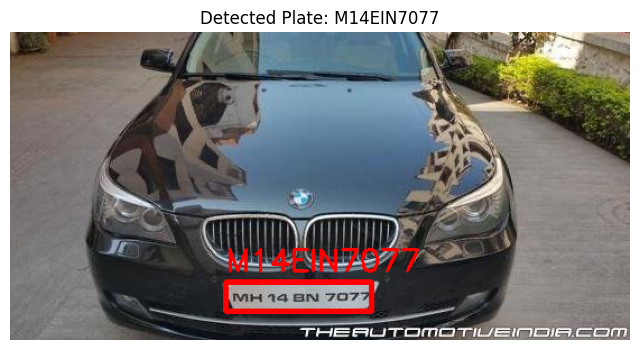


0: 448x640 1 licence, 36.9ms
Speed: 4.8ms preprocess, 36.9ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


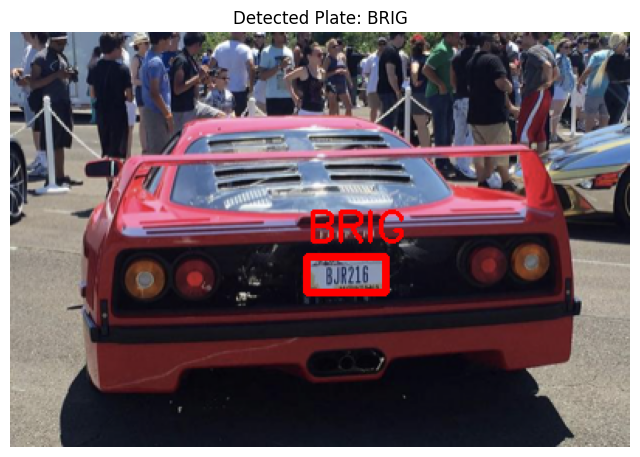


0: 448x640 1 licence, 9.6ms
Speed: 2.8ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


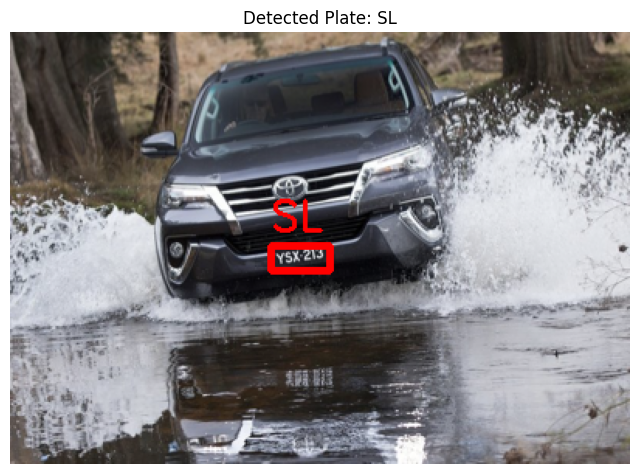


0: 448x640 1 licence, 9.0ms
Speed: 3.5ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


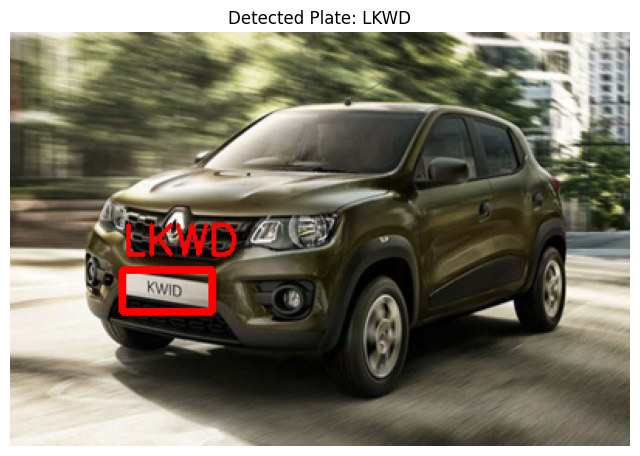


0: 480x640 2 licences, 45.9ms
Speed: 3.9ms preprocess, 45.9ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


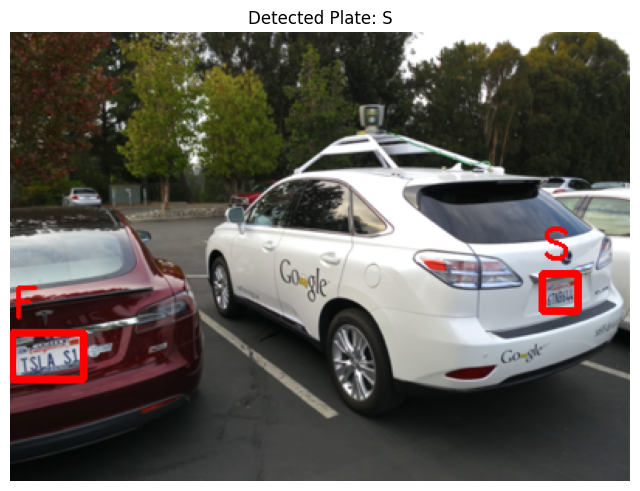


0: 384x640 2 licences, 79.7ms
Speed: 3.2ms preprocess, 79.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


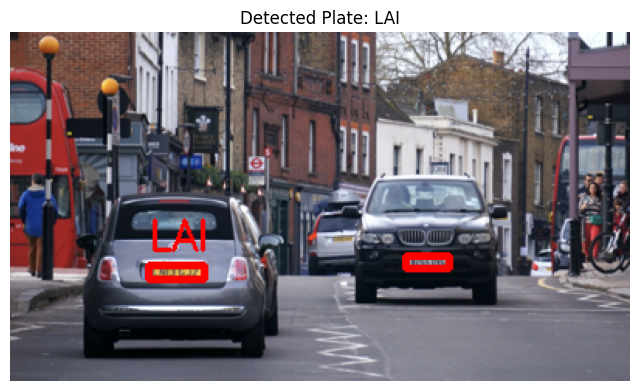


0: 320x640 1 licence, 14.4ms
Speed: 2.2ms preprocess, 14.4ms inference, 3.0ms postprocess per image at shape (1, 3, 320, 640)


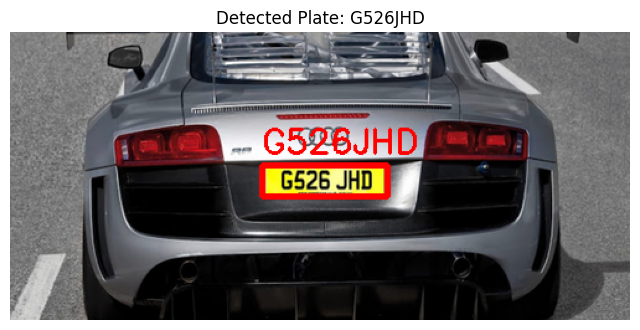


0: 384x640 1 licence, 14.7ms
Speed: 3.0ms preprocess, 14.7ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


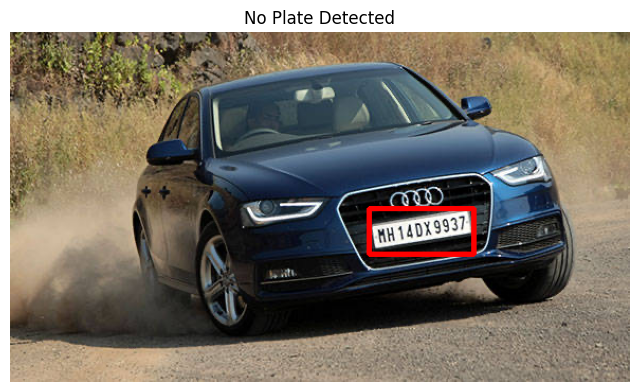


0: 576x640 1 licence, 68.1ms
Speed: 5.7ms preprocess, 68.1ms inference, 2.1ms postprocess per image at shape (1, 3, 576, 640)


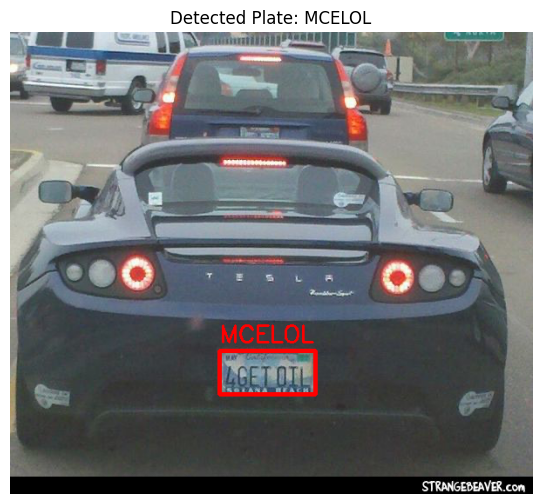


0: 448x640 5 licences, 16.7ms
Speed: 3.0ms preprocess, 16.7ms inference, 3.1ms postprocess per image at shape (1, 3, 448, 640)


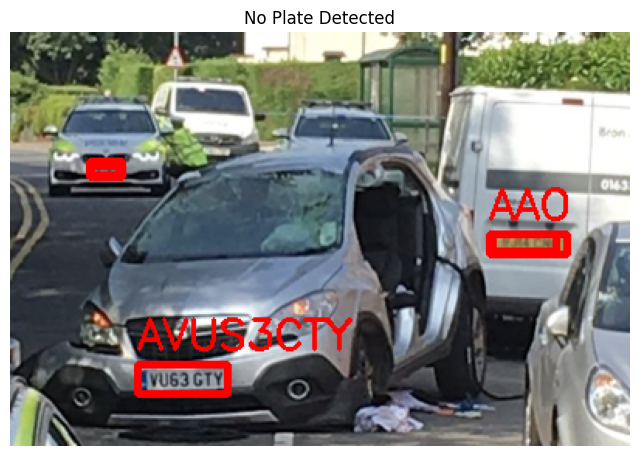


0: 544x640 1 licence, 56.2ms
Speed: 3.5ms preprocess, 56.2ms inference, 1.9ms postprocess per image at shape (1, 3, 544, 640)


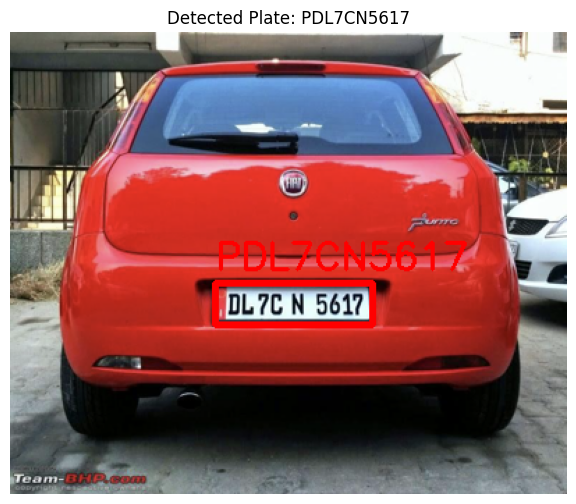


0: 480x640 4 licences, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


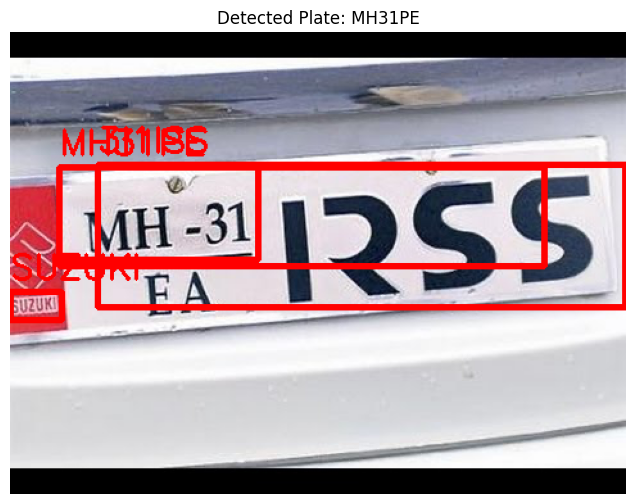


0: 480x640 1 licence, 9.8ms
Speed: 3.3ms preprocess, 9.8ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


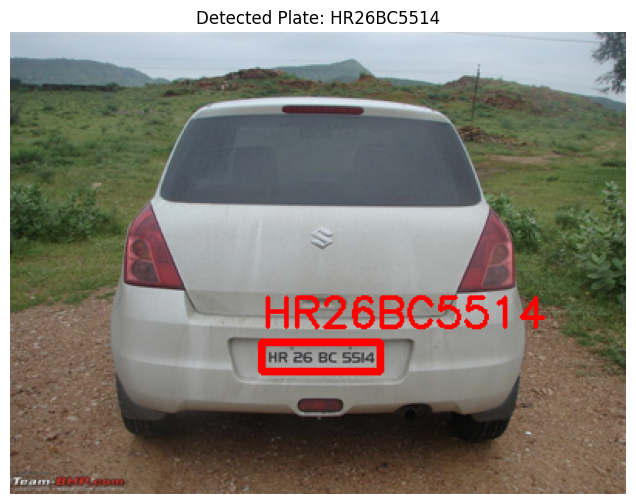


0: 480x640 1 licence, 10.0ms
Speed: 3.6ms preprocess, 10.0ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


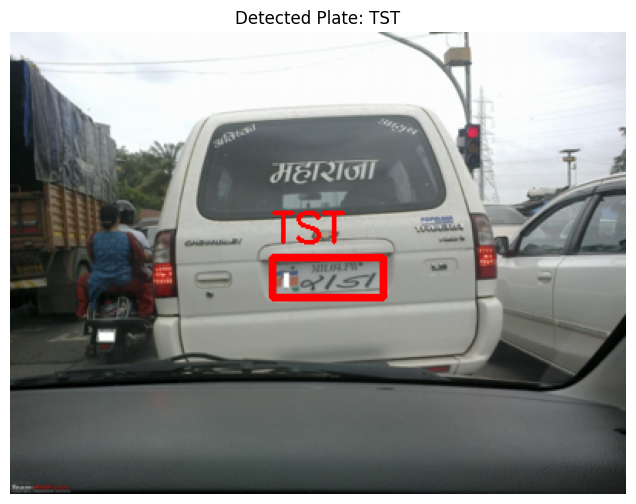


0: 480x640 1 licence, 11.0ms
Speed: 3.2ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


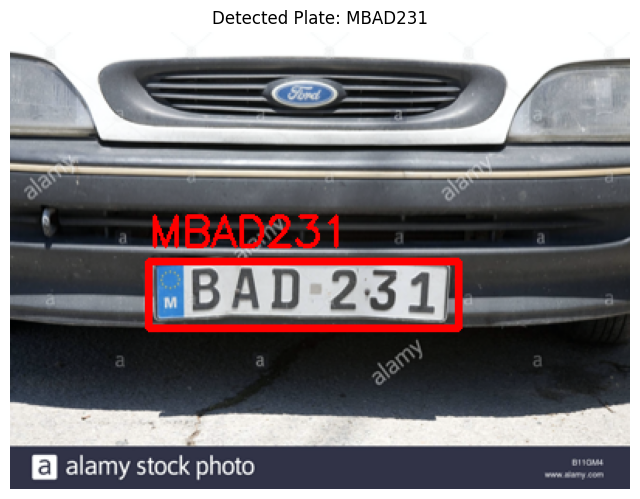


0: 480x640 1 licence, 9.2ms
Speed: 3.4ms preprocess, 9.2ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


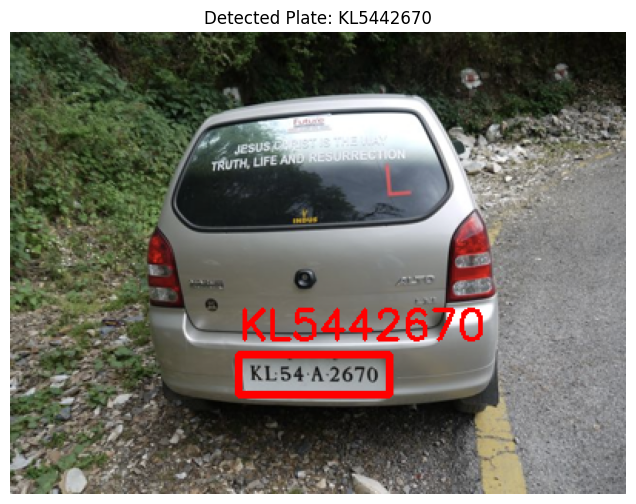


0: 256x640 1 licence, 80.8ms
Speed: 2.7ms preprocess, 80.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 640)


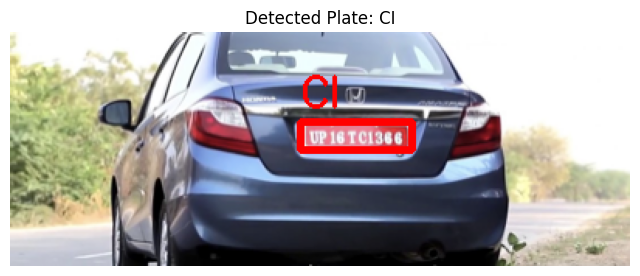


0: 384x640 1 licence, 17.5ms
Speed: 2.6ms preprocess, 17.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


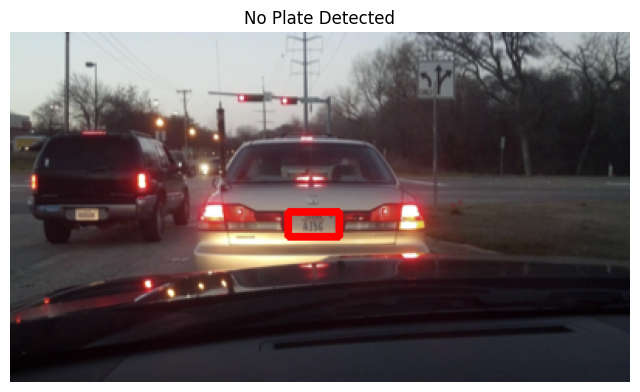


0: 416x640 3 licences, 84.6ms
Speed: 2.9ms preprocess, 84.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


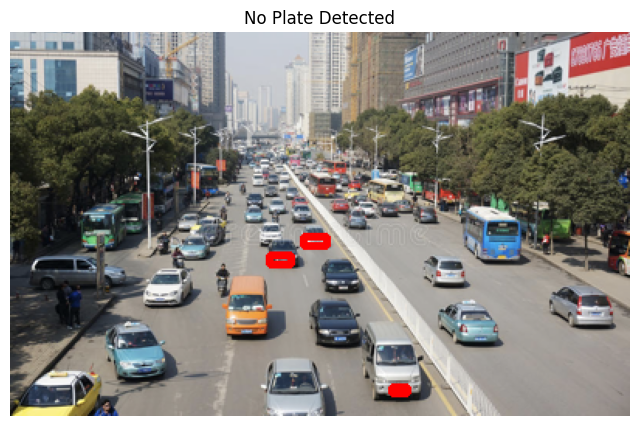


0: 384x640 1 licence, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


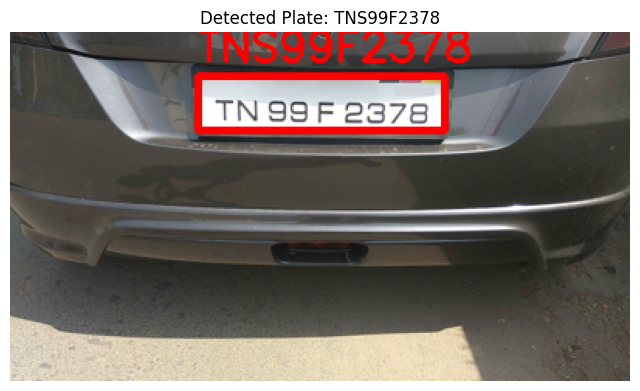


0: 480x640 2 licences, 9.9ms
Speed: 4.4ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


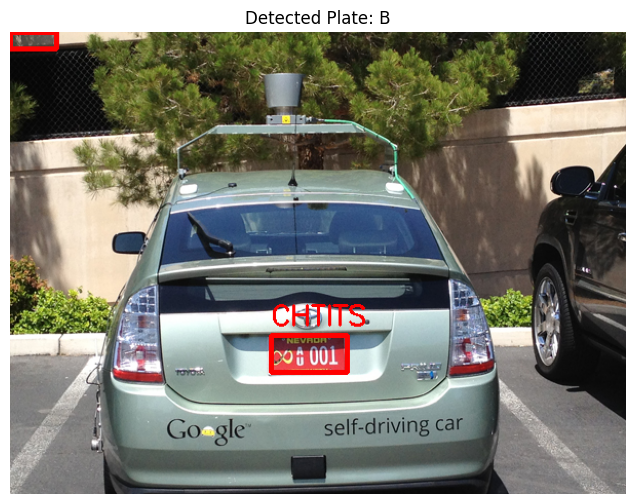


0: 448x640 1 licence, 10.3ms
Speed: 3.9ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


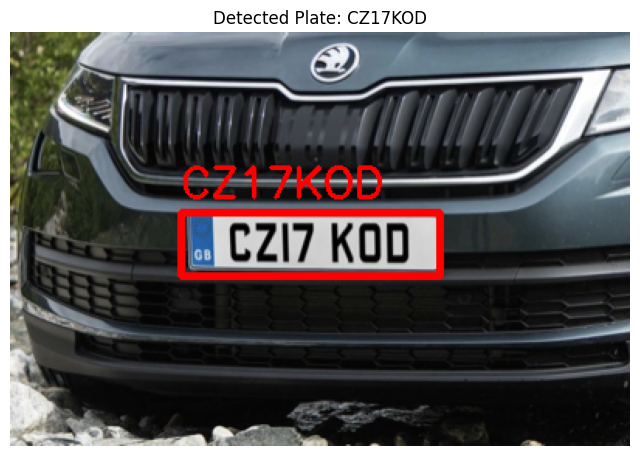


0: 480x640 2 licences, 11.0ms
Speed: 5.0ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


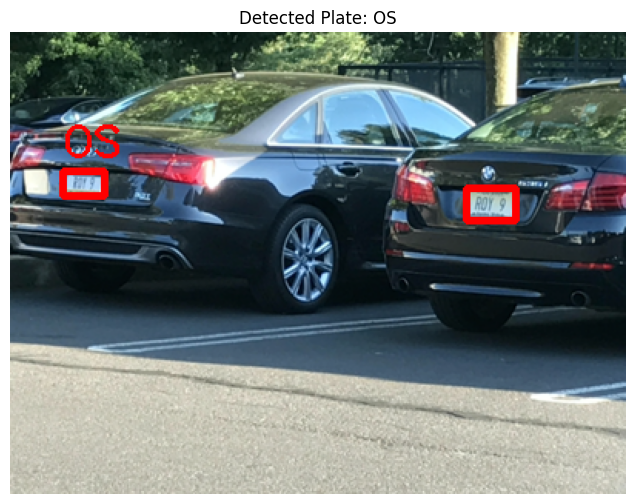


0: 448x640 1 licence, 10.7ms
Speed: 4.3ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


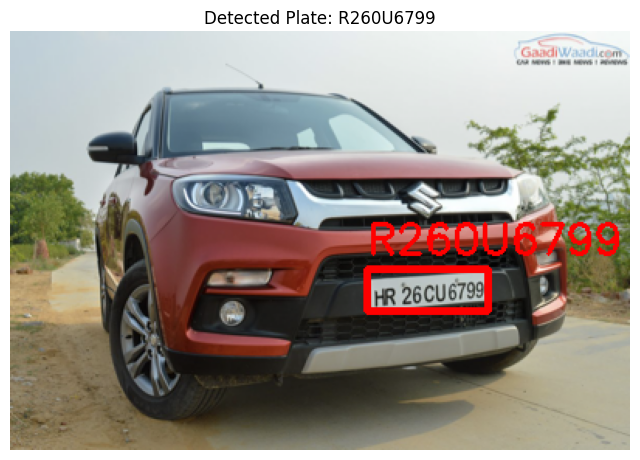


0: 416x640 1 licence, 10.7ms
Speed: 3.7ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


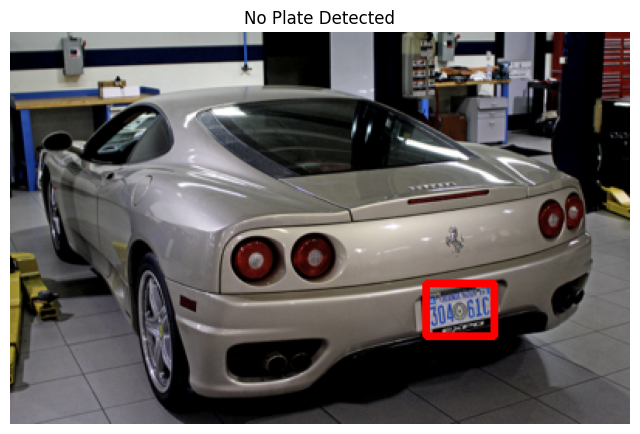


0: 480x640 2 licences, 14.0ms
Speed: 3.9ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


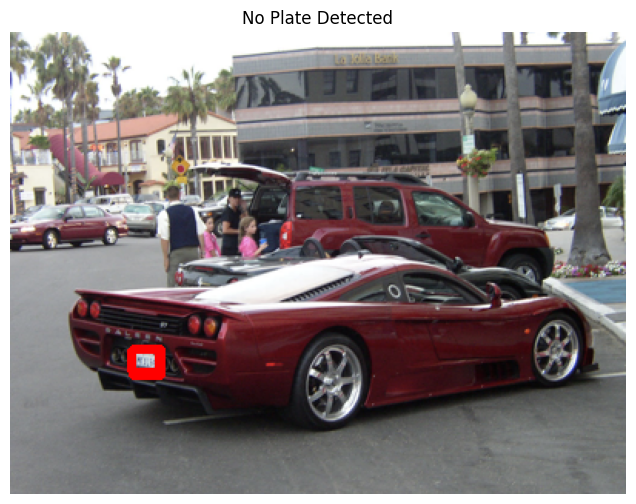


0: 640x480 1 licence, 56.9ms
Speed: 4.1ms preprocess, 56.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


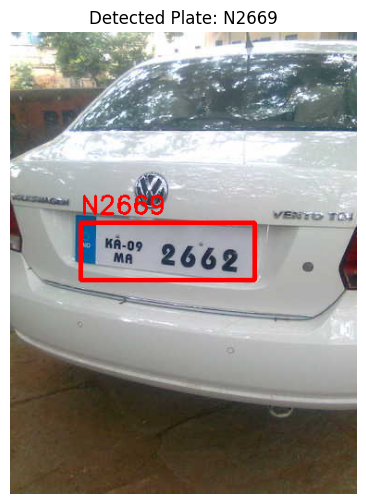


0: 448x640 5 licences, 12.5ms
Speed: 2.9ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


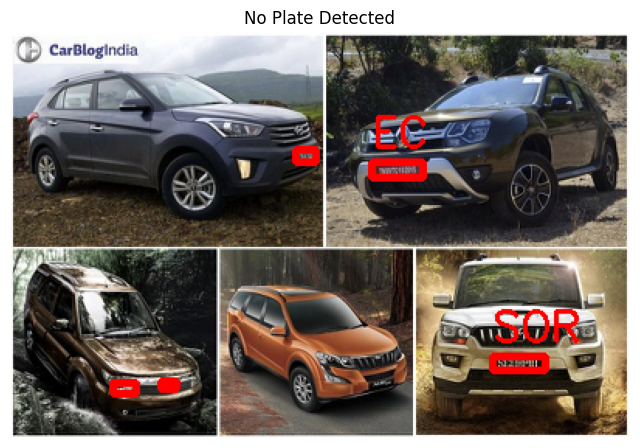


0: 512x640 1 licence, 68.2ms
Speed: 3.2ms preprocess, 68.2ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 640)


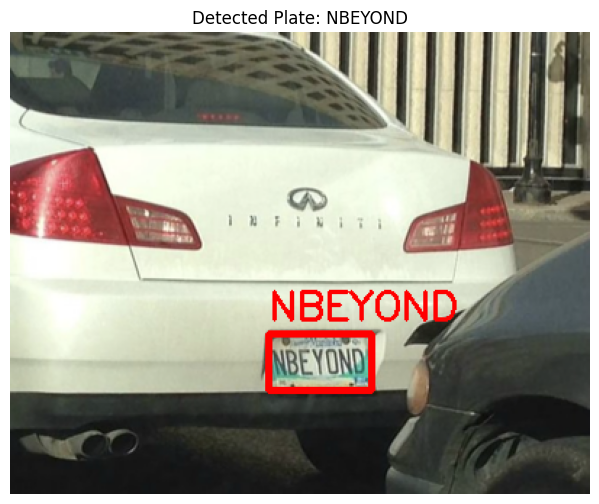


0: 512x640 1 licence, 9.2ms
Speed: 5.1ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


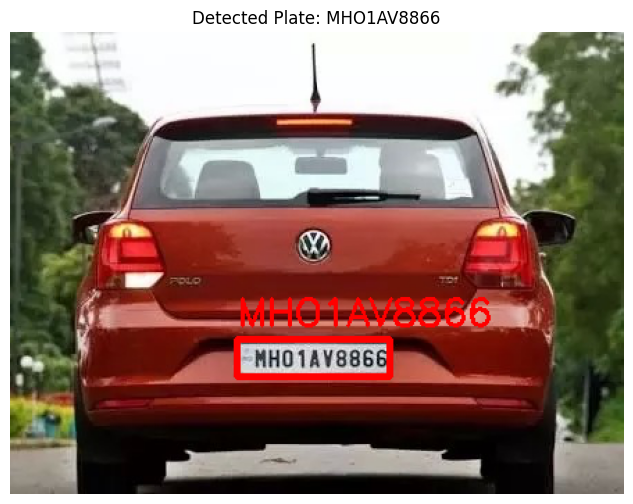


0: 448x640 1 licence, 18.7ms
Speed: 5.2ms preprocess, 18.7ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)


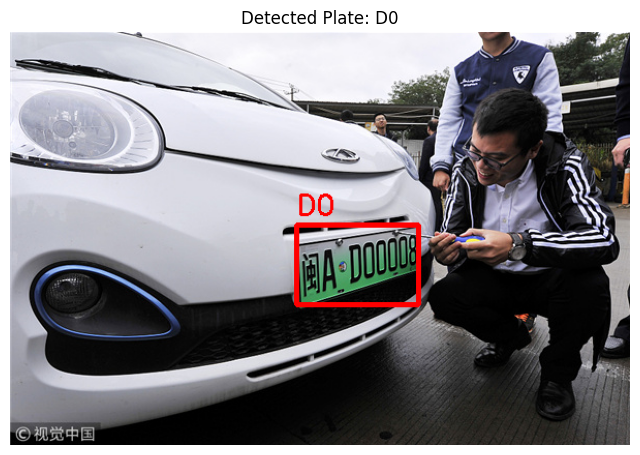


0: 480x640 1 licence, 10.4ms
Speed: 3.2ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


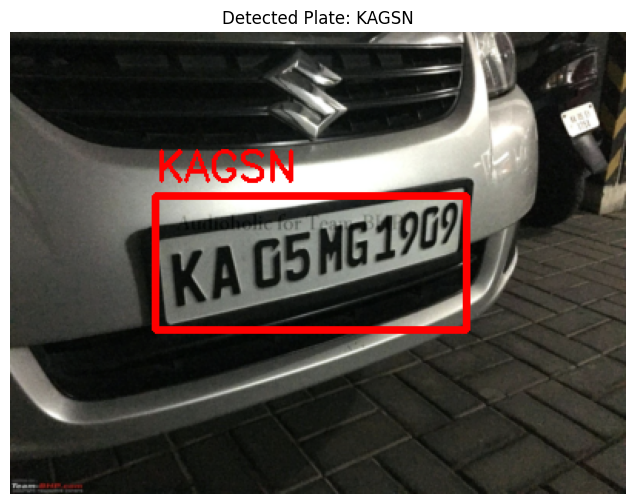


0: 640x608 2 licences, 55.0ms
Speed: 4.1ms preprocess, 55.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 608)


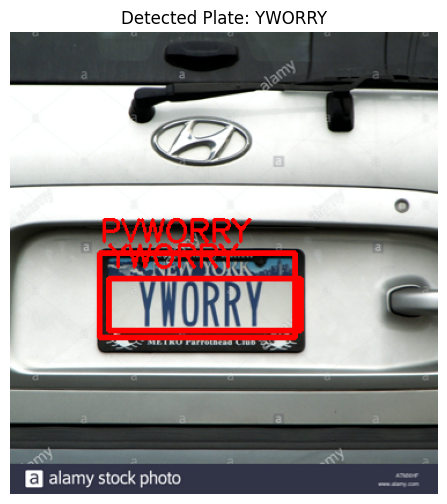


0: 448x640 1 licence, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


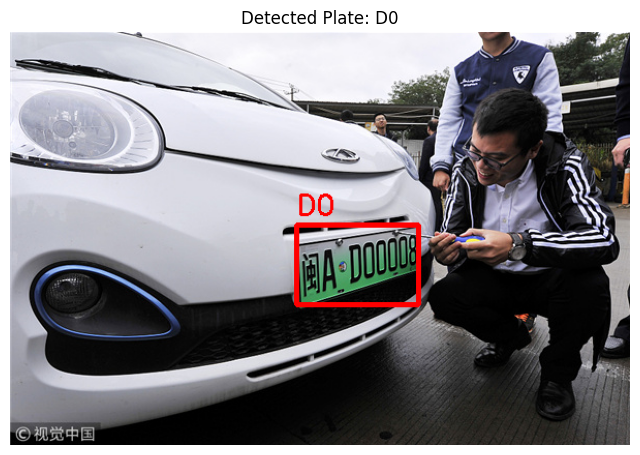


0: 416x640 3 licences, 10.9ms
Speed: 3.8ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


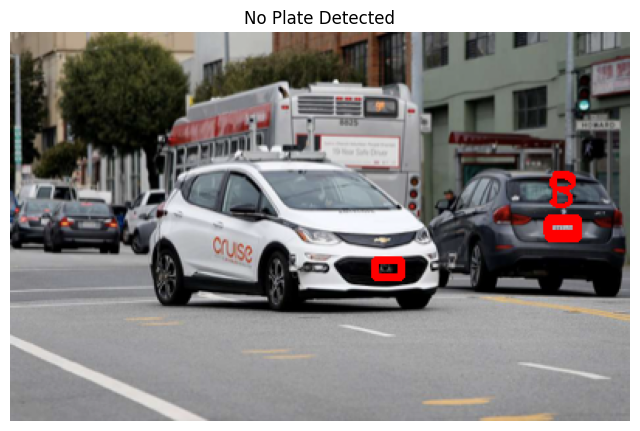


0: 416x640 1 licence, 9.7ms
Speed: 4.2ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


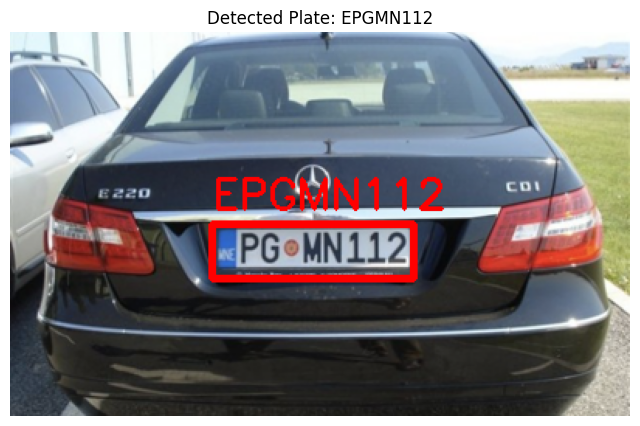

✅ Results saved to: /content/drive/MyDrive/license_plate_results.csv


In [ ]:
import os
import cv2
import pandas as pd
import pytesseract
import matplotlib.pyplot as plt
from ultralytics import YOLO
from glob import glob

# ✅ Load trained YOLO model
MODEL_PATH = "/content/drive/MyDrive/archive (38)/yolov8_license_plate.pt"
model = YOLO(MODEL_PATH)

# ✅ Define image folder path
IMAGE_FOLDER = "/content/drive/MyDrive/archive (38)/test/images"  # Change if needed

# ✅ List all image files in the folder
image_files = glob(os.path.join(IMAGE_FOLDER, "*.*"))

# ✅ Initialize DataFrame to store results
results_df = pd.DataFrame(columns=["Image", "Detected_Plate", "Geographic_Code"])

# ✅ Process each image
for img_path in image_files:
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert for display

    # Perform detection
    results = model(img)

    for result in results:
        if len(result.boxes) > 0:
            for box in result.boxes:
                # Extract bounding box
                x1, y1, x2, y2 = map(int, box.xyxy[0])

                # Crop the detected plate
                plate_crop = img[y1:y2, x1:x2]

                # Convert to grayscale for better OCR
                gray_plate = cv2.cvtColor(plate_crop, cv2.COLOR_BGR2GRAY)

                # OCR to extract plate number
                plate_number = pytesseract.image_to_string(gray_plate, config="--psm 8 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789").strip()

                # Extract geographic code (First 2-3 characters)
                geo_code = plate_number[:2] if len(plate_number) > 2 else "Unknown"

                # ✅ Append to DataFrame inside loop
                new_row = pd.DataFrame([{"Image": os.path.basename(img_path),
                                         "Detected_Plate": plate_number,
                                         "Geographic_Code": geo_code}])
                results_df = pd.concat([results_df, new_row], ignore_index=True)

                # ✅ Draw bounding box on image
                cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 3)
                cv2.putText(img_rgb, plate_number, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    # ✅ Display the image with bounding box
    plt.figure(figsize=(8, 6))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(f"Detected Plate: {plate_number}" if plate_number else "No Plate Detected")
    plt.show()

# ✅ Save results to CSV
RESULT_CSV_PATH = "/content/drive/MyDrive/license_plate_results.csv"
results_df.to_csv(RESULT_CSV_PATH, index=False)

print(f"✅ Results saved to: {RESULT_CSV_PATH}")
